In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import plotly.express as ex
import pandas as pd

from numpy import exp

from tracking.motion import ConstantVelocityModel, constant_velocity_models
from tracking.target import ConstantAccelerationTarget, ConstantVelocityTarget, SinusTarget, SingerTarget
from tracking.kalman import KalmanFilter6D
from tracking.evaluation import evaluate, monte_carlo, rmse

from tracking.plot import boxplot_rmse, plot_position_errors, aggregated_errors, plot_aggregated_errors
from tracking.util import to_df

## Constant-Velocity Target

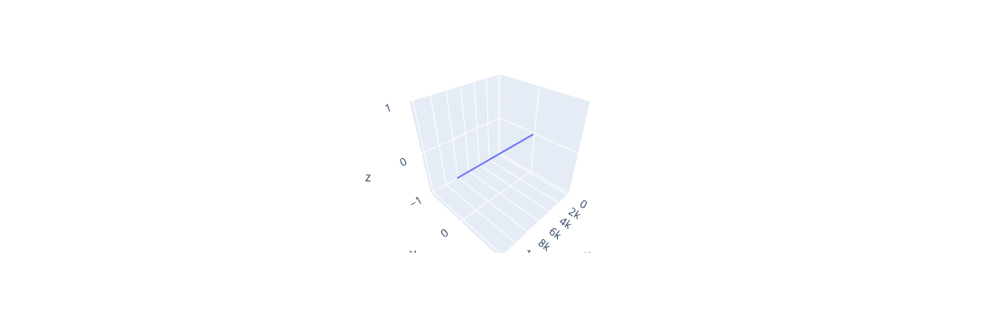

In [3]:
target = ConstantVelocityTarget()

fig = ex.scatter_3d(target.positions_df(), x='x', y='y', z='z')
fig.update_traces(marker_size = 1)
fig

In [4]:
motion  = constant_velocity_models(.1 ,.5, 1, 2, 5, 10, 20)
z_sigma = [.87, 8.72, 87.2]
results = monte_carlo(target, motion, z_sigma)

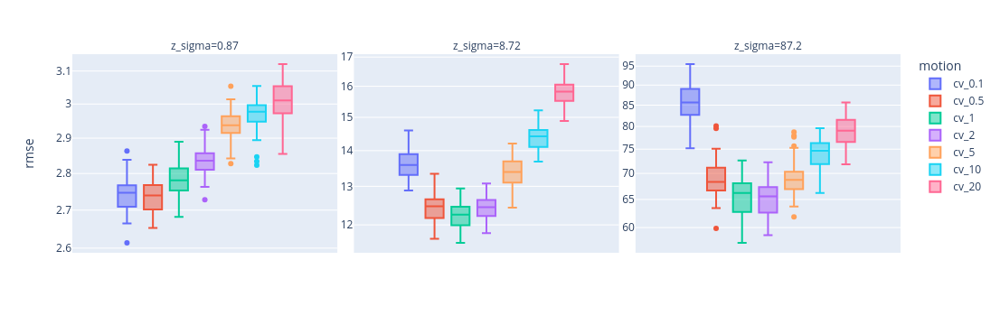

In [5]:
data = rmse(results)

fig=ex.box(data, y='rmse', color='motion', facet_col='z_sigma', log_y=True)
fig.update_xaxes(type='category')
fig.update_yaxes(matches=None, showticklabels=True)
fig

In [6]:
r = results.select(z_sigma=.87)[0]
r

EvaluationResult {'target': 'cv', 'motion': 'cv_0.1', 'z_sigma': 0.87, 'seed': 0, 'R': 0.7569}

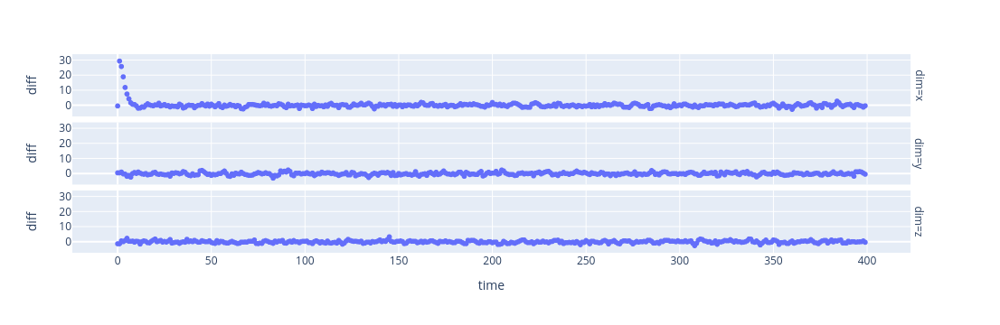

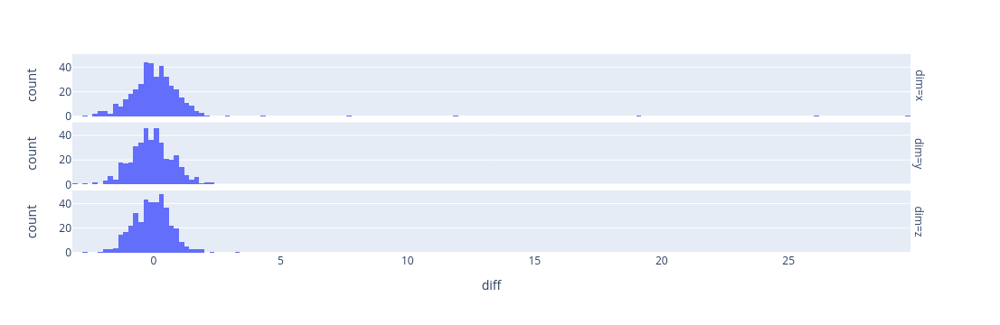

In [7]:
plot_position_errors(r)

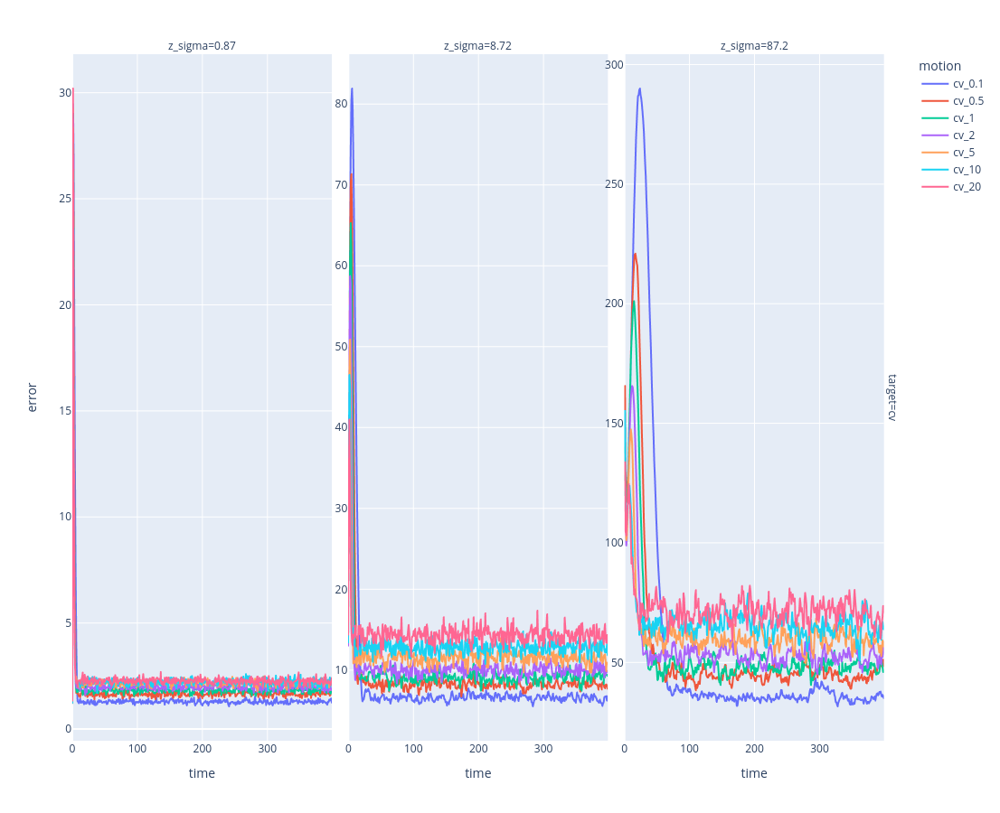

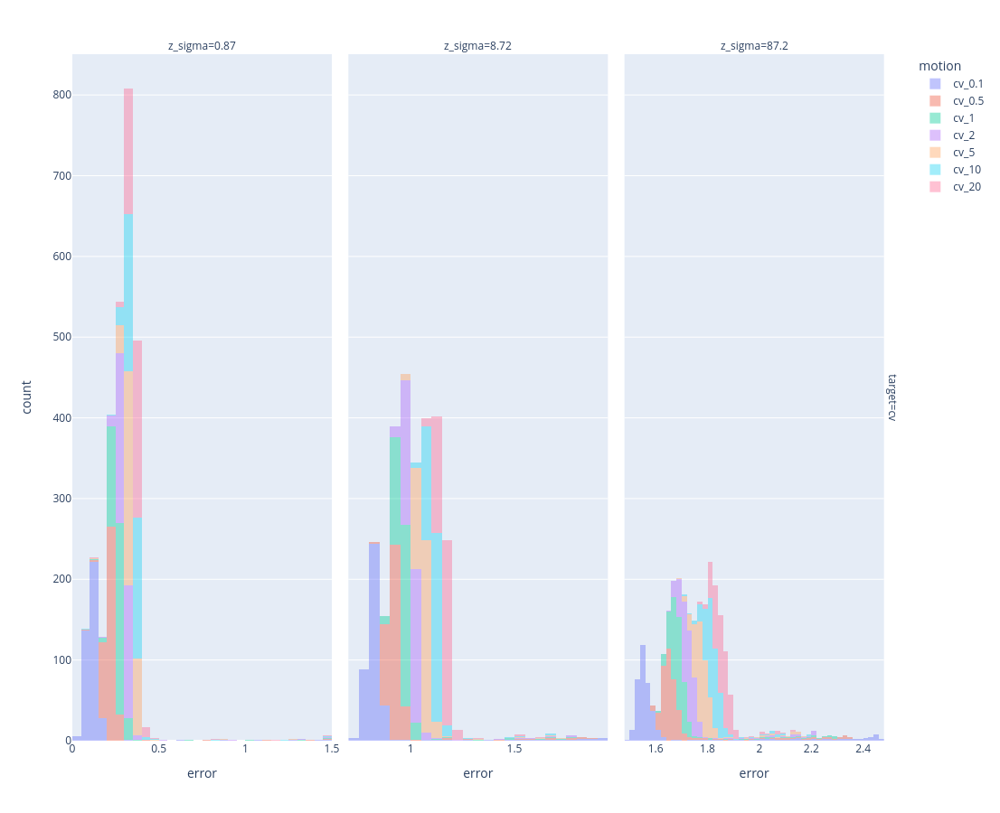

In [8]:
plot_aggregated_errors(results)

## Constant-Acceleration Target

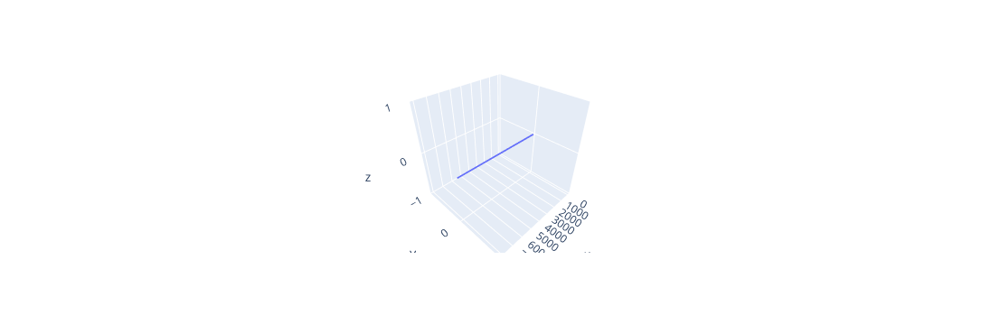

In [9]:
target = ConstantAccelerationTarget()

fig = ex.scatter_3d(target.positions_df(), x='x', y='y', z='z')
fig.update_traces(marker_size = 1)
fig

In [10]:
targets = [ConstantAccelerationTarget(.1), ConstantAccelerationTarget(.5), ConstantAccelerationTarget(2)]
motion  = constant_velocity_models(.1 ,.5, 1, 2, 5, 10, 20)
z_sigma = [.87, 8.72, 87.2]
results = monte_carlo(targets, motion, z_sigma)

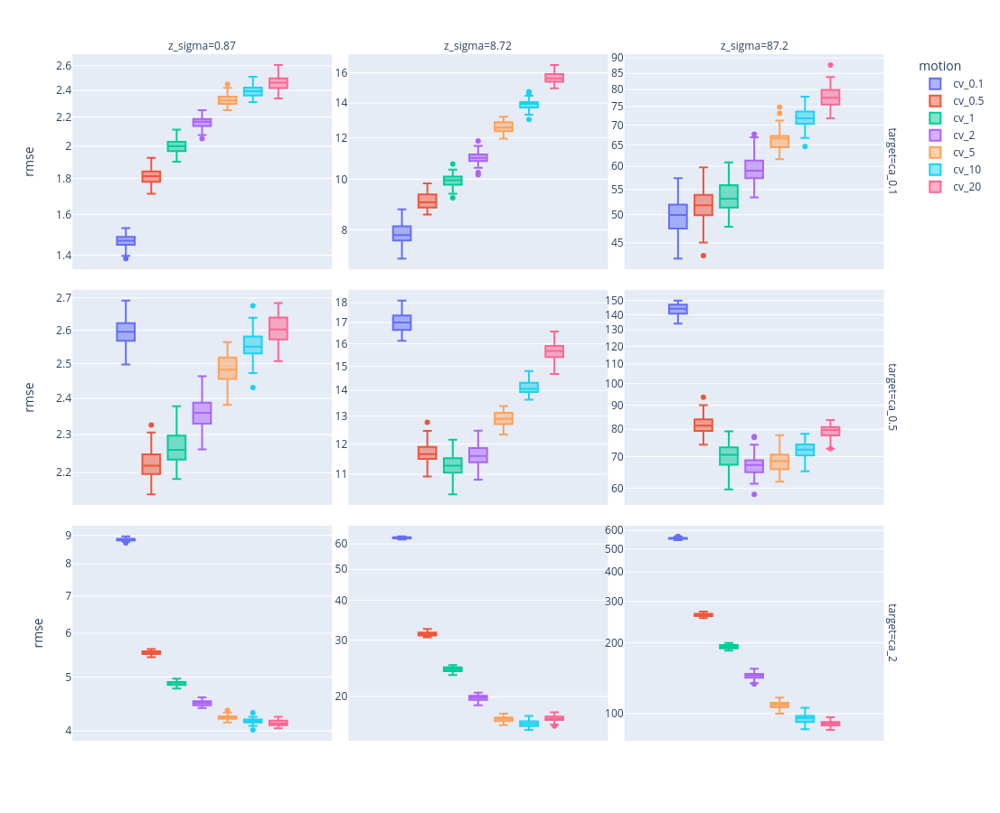

In [11]:
data = rmse(results)

fig=ex.box(data, y='rmse', color='motion', facet_col='z_sigma', facet_row='target', log_y=True)
fig.update_xaxes(type='category')
fig.update_yaxes(matches=None, showticklabels=True)
fig.update_layout(width=1100, height=900)
fig

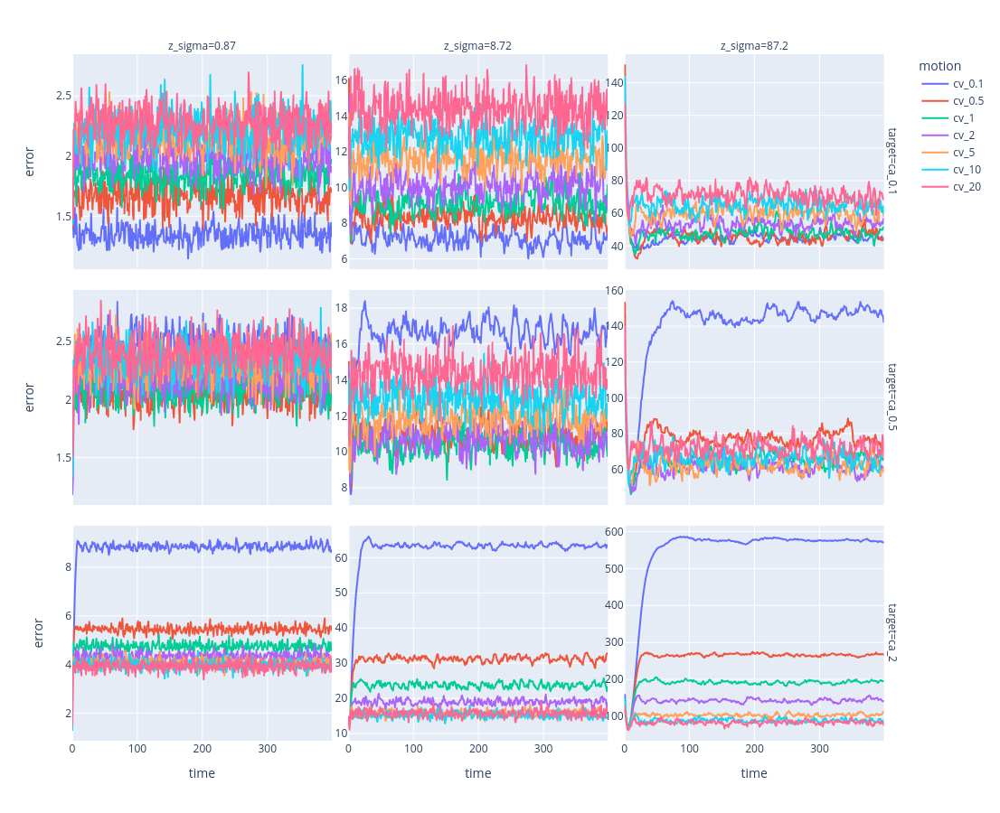

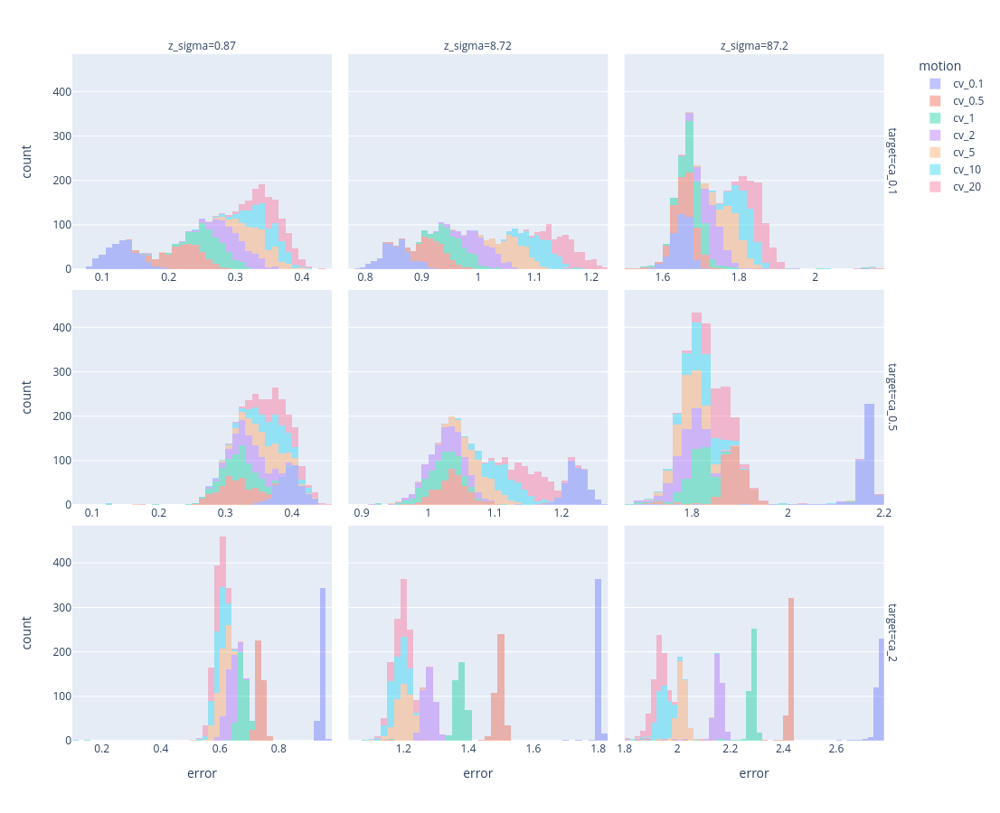

In [12]:
plot_aggregated_errors(results)